# Reproducibility with original data

This tutorial demonstrates spatial data alignment on 10X Visium DLPFC data using Pysodb and Paste.

A reference paper can be found at https://www.nature.com/articles/s41592-022-01459-6.

This tutorial refers to the following tutorial at https://github.com/raphael-group/paste_reproducibility/blob/main/notebooks/DLPFC_pairwise.ipynb. At the same time, the way of loadding data is modified by using Pysodb.

## Import packages and set configurations

In [1]:
# Imports various packages for data analysis and visualization. 
# pandas: used for data manipulation and analysis.
import pandas as pd
# numpy: used for numerical computing, including mathematical operations on arrays and matrices.
import numpy as np
# seaborn: used for statistical data visualization, providing high-level interfaces for creating informative and attractive visualizations.
import seaborn as sns
# matplotlib: a comprehensive library for creating static, animated, and interactive visualizations in Python.
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib import style
# time: provides time-related functions, such as measuring execution time and converting between time formats.
import time
# scanpy: a Python package for single-cell gene expression analysis, including preprocessing, clustering, and differential expression analysis.
import scanpy as sc
# networkx: a Python package for creating, manipulating, and studying complex networks.
import networkx as nx
style.use('seaborn-white')

/tmp/ipykernel_62466/185176416.py:20: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  style.use('seaborn-white')


In [2]:
# Import paste package
import paste as pst

## Streamline development of loading spatial data with Pysodb

In [3]:
# Import pysodb package
# Pysodb is a Python package that provides a set of tools for working with SODB databases. 
# SODB is a format used to store data in memory-mapped files for efficient access and querying. 
# This package allows users to interact with SODB files using Python.
import pysodb

In [4]:
# Initialization
sodb = pysodb.SODB()

In [5]:
# Get the list of datasets with specific category
# Categories ["Spatial Transcriptomics", "Spatial Proteomics", "Spatial Metabolomics", "Spatial Genomics", "Spatial MultiOmics"]
sodb.list_dataset_by_category('Spatial Transcriptomics')

['wang2021easi',
 'Vickovic2019high',
 'xia2022the',
 'guilliams2022spatial',
 'xia2019spatial',
 'Ratz2022Clonal',
 'Shi2022Spatial',
 'ortiz2020molecular',
 'Marshall2022High_mouse',
 'he2020integrating',
 'Konieczny2022Interleukin',
 'Joglekar2021A',
 'gracia2021genome',
 'hildebrandt2021spatial',
 'stahl2016visualization',
 'Pascual2021Dietary',
 'kvastad2021the',
 'backdahl2021spatial',
 'Barkley2022Cancer',
 'maniatis2019spatiotemporal',
 'Fang2022Conservation',
 'Misra2021Characterizing',
 'wei2022single',
 'Dixon2022Spatially',
 'Zhang2023Amolecularly_rawcount',
 'Booeshaghi2021Isoform',
 'Vickovic2019high_update',
 'Alon2021Expansion',
 'wang2022high',
 'Kadur2022Human',
 'Wang2018Three_1k',
 'Sun2022Excitatory',
 'chen2021dissecting',
 'thrane2018spatially',
 'lohoff2021integration',
 'ji2020multimodal',
 'moncada2020integrating',
 'Marshall2022High_human',
 'Melo2021Integrating',
 'zhang2021spatially',
 'Garcia2021Mapping',
 'codeluppi2018spatial',
 'Wu2022spatial',
 'Bierma

In [6]:
# Get the list of datasets
adata_list = sodb.load_dataset('maynard2021trans')

load experiment[151508] in dataset[maynard2021trans]
load experiment[151671] in dataset[maynard2021trans]
load experiment[151507] in dataset[maynard2021trans]
load experiment[151674] in dataset[maynard2021trans]
load experiment[151670] in dataset[maynard2021trans]
load experiment[151669] in dataset[maynard2021trans]
load experiment[151676] in dataset[maynard2021trans]
load experiment[151675] in dataset[maynard2021trans]
load experiment[151509] in dataset[maynard2021trans]
load experiment[151673] in dataset[maynard2021trans]
load experiment[151672] in dataset[maynard2021trans]
load experiment[151510] in dataset[maynard2021trans]


In [7]:
adata_list

{'151508': AnnData object with n_obs × n_vars = 4384 × 33538
     obs: 'in_tissue', 'array_row', 'array_col', 'Region', 'leiden'
     var: 'gene_ids', 'feature_types', 'genome', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
     uns: 'Region_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'moranI', 'neighbors', 'pca', 'spatial', 'spatial_neighbors', 'umap'
     obsm: 'X_pca', 'X_umap', 'spatial'
     varm: 'PCs'
     obsp: 'connectivities', 'distances', 'spatial_connectivities', 'spatial_distances',
 '151671': AnnData object with n_obs × n_vars = 4110 × 33538
     obs: 'in_tissue', 'array_row', 'array_col', 'Region', 'leiden'
     var: 'gene_ids', 'feature_types', 'genome', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
     uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'moranI', 'neighbors', 'pca', 'spatial', 'spatial_neighbors', 'umap'
     obsm: 'X_pca', 'X_umap', 'spatial'
     varm: 'PCs'
     obsp: 'connectivities', 'distances', 'spatial_conne

## Preparation 

In [8]:
# Define a list containing 12 samples
sample_list = ["151507", "151508", "151509","151510", "151669", "151670","151671", "151672", "151673","151674", "151675", "151676"]

In [9]:
# Create a new dictionary called "adatas" by removing  missing values in the "Region" column from each dataset in the original dictionary "adata_list".
adatas = {}
for key in adata_list.keys():
    a = adata_list[key]
    a = a[np.logical_not(a.obs['Region'].isna())]
    adatas[key] = a

In [10]:
# Define groups of samples based on IDs
sample_groups = [["151507", "151508", "151509","151510"],[ "151669", "151670","151671", "151672"],[ "151673","151674", "151675", "151676"]]
# Create a list called layer_groups where each sub-list contains AnnData objects for each sample in the corresponding to sample_groups
layer_groups = [[adatas[sample_groups[j][i]] for i in range(len(sample_groups[j]))] for j in range(len(sample_groups))]
# Create a dictionary that maps layers to various colors from the default Seaborn color palette. 
layer_to_color_map = {'Layer{0}'.format(i+1):sns.color_palette()[i] for i in range(6)}
layer_to_color_map['WM'] = sns.color_palette()[6]

In [11]:
layer_groups

[[View of AnnData object with n_obs × n_vars = 4221 × 33538
      obs: 'in_tissue', 'array_row', 'array_col', 'Region', 'leiden'
      var: 'gene_ids', 'feature_types', 'genome', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
      uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'moranI', 'neighbors', 'pca', 'spatial', 'spatial_neighbors', 'umap'
      obsm: 'X_pca', 'X_umap', 'spatial'
      varm: 'PCs'
      obsp: 'connectivities', 'distances', 'spatial_connectivities', 'spatial_distances',
  View of AnnData object with n_obs × n_vars = 4381 × 33538
      obs: 'in_tissue', 'array_row', 'array_col', 'Region', 'leiden'
      var: 'gene_ids', 'feature_types', 'genome', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
      uns: 'Region_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'moranI', 'neighbors', 'pca', 'spatial', 'spatial_neighbors', 'umap'
      obsm: 'X_pca', 'X_umap', 'spatial'
      varm: 'PCs'
      obsp: 'connectivities', 'distances', 'spa

In [12]:
# Redefine a function called visualize_slices to generate a visualization of tissue regions for different samples and different slices
def visualize_slices(layer_groups, adatas, sample_list, slice_map, layer_to_color_map, key):
    n_rows = len(layer_groups)
    n_cols = len(layer_groups[0])

    plot, axs = plt.subplots(n_rows, n_cols, figsize=(15, 11.5))

    for j in range(n_rows):
        axs[j, 0].text(-0.1, 0.5, 'Sample ' + slice_map[j], fontsize=12, rotation='vertical', transform=axs[j, 0].transAxes, verticalalignment='center')
        for i in range(n_cols):
            adata = adatas[sample_list[j * n_cols + i]]
            colors = list(adata.obs[key].astype('str').map(layer_to_color_map))
            colors = [(r, g, b) for r, g, b in colors]

            axs[j, i].scatter(layer_groups[j][i].obsm['spatial'][:, 0], layer_groups[j][i].obsm['spatial'][:, 1], linewidth=0, s=20, marker=".",
                              color=colors
                              )
            axs[j, i].set_title('Slice ' + slice_map[i], size=12)
            axs[j, i].invert_yaxis()
            axs[j, i].axis('off')
            axs[j, i].axis('equal')
            
            if i<n_cols-1:
                s = '300$\mu$m' if i==1 else "10$\mu$m"
                delta = 0.05 if i==1 else 0
                axs[j,i].annotate('',xy=(1-delta, 0.5), xytext=(1.2+delta, 0.5),xycoords=axs[j,i].transAxes,textcoords=axs[j,i].transAxes,arrowprops=dict(arrowstyle='<->',lw=1))
                axs[j,0].text(1.1, 0.55, s,fontsize=9,transform = axs[j,i].transAxes,horizontalalignment='center')
            

        legend_handles = [mpatches.Patch(color=layer_to_color_map[adata.obs[key].cat.categories[i]], label=adata.obs[key].cat.categories[i]) for i in range(len(adata.obs[key].cat.categories))]
        axs[j, n_cols-1].legend(handles=legend_handles, fontsize=10, title='Cortex layer', title_fontsize=12, bbox_to_anchor=(1, 1))

    return plot


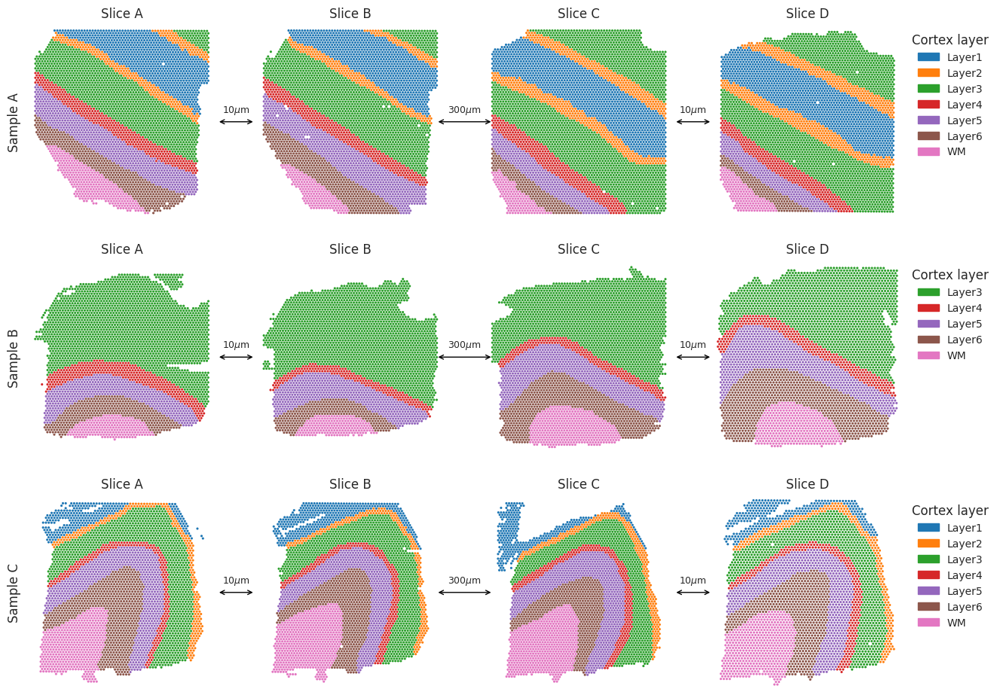

In [13]:
# Define a dictionary for slice map
slice_map = {0: 'A', 1: 'B', 2: 'C', 3: 'D'}
# Visualize the different slices mapped by layer_groups
plot = visualize_slices(layer_groups, adatas, sample_list, slice_map, layer_to_color_map, key= 'Region')
plt.show()

## Running PASTE for alignment

In [14]:
# Redefine compute_pairwise_alignment function to compute the pairwise alignment between consecutive layers within each layer group, stores the resulting mappings in a list called pis
def compute_pairwise_alignment(groups, alpha=0.1):
    pis = [[None for i in range(len(groups[j])-1)] for j in range(len(groups))]
    
    for j in range(len(groups)):
        for i in range(len(groups[j])-1):
            pi0 = pst.match_spots_using_spatial_heuristic(groups[j][i].obsm['spatial'], groups[j][i+1].obsm['spatial'], use_ot=True)
            start = time.time()
            pis[j][i] = pst.pairwise_align(groups[j][i], groups[j][i+1], alpha=alpha, G_init=pi0, norm=True, verbose=False)
            tt = time.time() - start
            print(j, i, 'time', tt)

    return pis

In [15]:
pis = compute_pairwise_alignment(groups = layer_groups, alpha=0.1)

Using selected backend cpu. If you want to use gpu, set use_gpu = True.
0 0 time 202.1374397277832
Using selected backend cpu. If you want to use gpu, set use_gpu = True.


RESULT MIGHT BE INACURATE
Max number of iteration reached, currently 100000. Sometimes iterations go on in cycle even though the solution has been reached, to check if it's the case here have a look at the minimal reduced cost. If it is very close to machine precision, you might actually have the correct solution, if not try setting the maximum number of iterations a bit higher
/home/linsenlin/anaconda3/envs/alignment/lib/python3.8/site-packages/ot/lp/__init__.py:343: UserWarning: numItermax reached before optimality. Try to increase numItermax.
  result_code_string = check_result(result_code)
RESULT MIGHT BE INACURATE
Max number of iteration reached, currently 100000. Sometimes iterations go on in cycle even though the solution has been reached, to check if it's the case here have a look at the minimal reduced cost. If it is very close to machine precision, you might actually have the correct solution, if not try setting the maximum number of iterations a bit higher
RESULT MIGHT BE IN

0 1 time 31.971270322799683
Using selected backend cpu. If you want to use gpu, set use_gpu = True.


RESULT MIGHT BE INACURATE
Max number of iteration reached, currently 100000. Sometimes iterations go on in cycle even though the solution has been reached, to check if it's the case here have a look at the minimal reduced cost. If it is very close to machine precision, you might actually have the correct solution, if not try setting the maximum number of iterations a bit higher
/home/linsenlin/anaconda3/envs/alignment/lib/python3.8/site-packages/ot/lp/__init__.py:343: UserWarning: numItermax reached before optimality. Try to increase numItermax.
  result_code_string = check_result(result_code)
RESULT MIGHT BE INACURATE
Max number of iteration reached, currently 100000. Sometimes iterations go on in cycle even though the solution has been reached, to check if it's the case here have a look at the minimal reduced cost. If it is very close to machine precision, you might actually have the correct solution, if not try setting the maximum number of iterations a bit higher


0 2 time 18.63774585723877
Using selected backend cpu. If you want to use gpu, set use_gpu = True.
1 0 time 339.0843195915222
Using selected backend cpu. If you want to use gpu, set use_gpu = True.


RESULT MIGHT BE INACURATE
Max number of iteration reached, currently 100000. Sometimes iterations go on in cycle even though the solution has been reached, to check if it's the case here have a look at the minimal reduced cost. If it is very close to machine precision, you might actually have the correct solution, if not try setting the maximum number of iterations a bit higher
/home/linsenlin/anaconda3/envs/alignment/lib/python3.8/site-packages/ot/lp/__init__.py:343: UserWarning: numItermax reached before optimality. Try to increase numItermax.
  result_code_string = check_result(result_code)
RESULT MIGHT BE INACURATE
Max number of iteration reached, currently 100000. Sometimes iterations go on in cycle even though the solution has been reached, to check if it's the case here have a look at the minimal reduced cost. If it is very close to machine precision, you might actually have the correct solution, if not try setting the maximum number of iterations a bit higher
RESULT MIGHT BE IN

1 1 time 16.74564242362976
Using selected backend cpu. If you want to use gpu, set use_gpu = True.
1 2 time 96.79306101799011
Using selected backend cpu. If you want to use gpu, set use_gpu = True.
2 0 time 98.5936119556427
Using selected backend cpu. If you want to use gpu, set use_gpu = True.
2 1 time 120.30212950706482
Using selected backend cpu. If you want to use gpu, set use_gpu = True.
2 2 time 139.2454333305359


When encountering the error "Error: module 'ot.gromov' has no attribute 'cg'", users should first activate the virtual environment at the terminal and then downgrade POT with the following command："pip install POT==0.8.2". 

In [16]:
# Align spatial coordinates of sequential pairwise slices
paste_layer_groups = [pst.stack_slices_pairwise(layer_groups[j], pis[j]) for j in range(len(layer_groups)) ]

In [17]:
#  Define a function to plots spatial coordinates of cells in different groups
def plot_slices_overlap(groups, adatas, sample_list, layer_to_color_map,save=None,):
    marker_list = ['.','*','x','+']
    
    for j in range(len(groups)): 
        plt.figure(figsize=(10,10))
        for i in range(len(groups[j])):
            adata = adatas[sample_list[j*4+i]]
            colors = list(adata.obs['Region'].astype('str').map(layer_to_color_map))
            plt.scatter(groups[j][i].obsm['spatial'][:,0],groups[j][i].obsm['spatial'][:,1],linewidth=1,s=80, marker=marker_list[i],color=colors,alpha=0.7)
        plt.legend(handles=[mpatches.Patch(color=layer_to_color_map[adata.obs['Region'].cat.categories[i]], label=adata.obs['Region'].cat.categories[i]) for i in range(len(adata.obs['Region'].cat.categories))],fontsize=10,title='Cortex layer',title_fontsize=15,bbox_to_anchor=(1, 1))
        plt.gca().invert_yaxis()
        plt.axis('off') 
        if save is None:
            plt.show()
        else:
            plt.savefig(f'{save}_{j}.pdf',bbox_inches='tight',transparent=True)
        

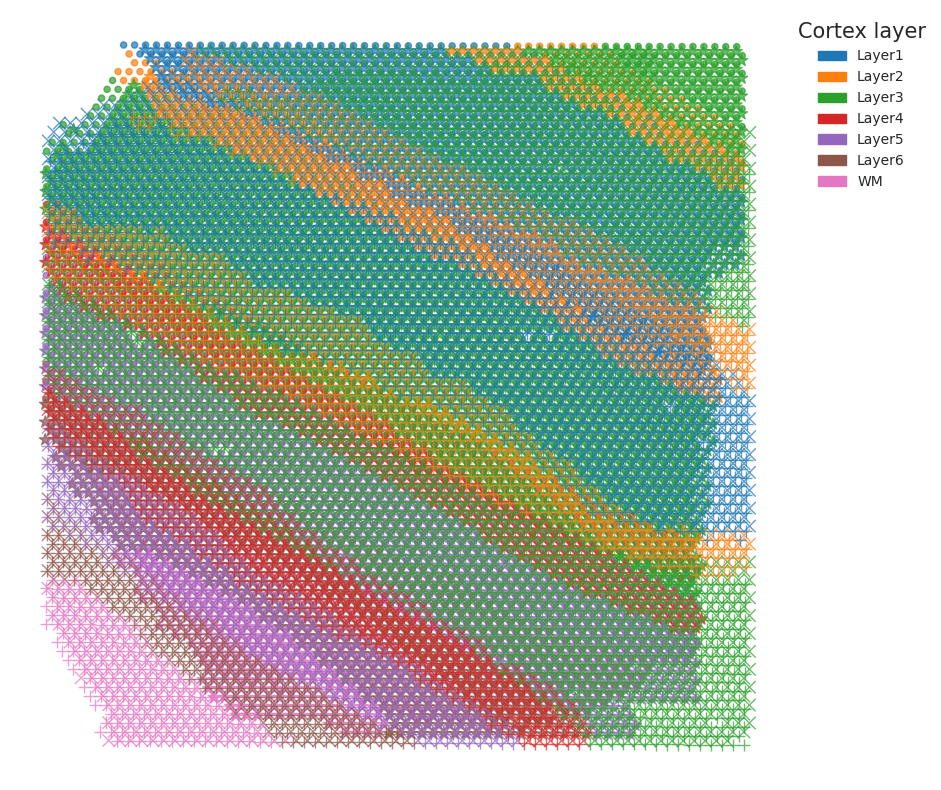

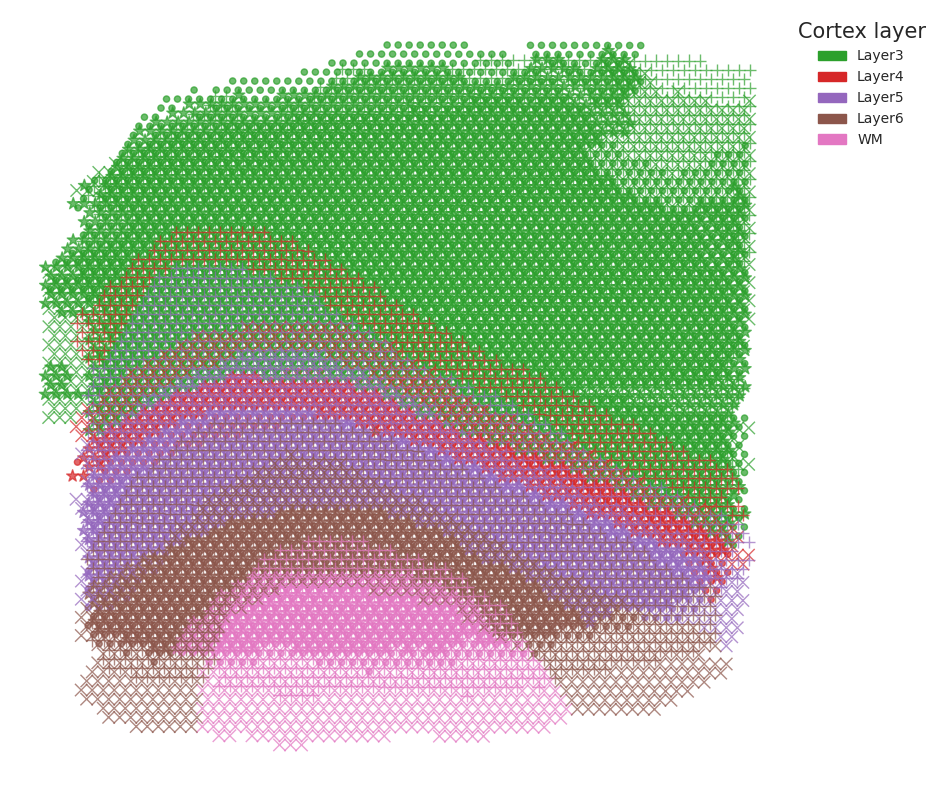

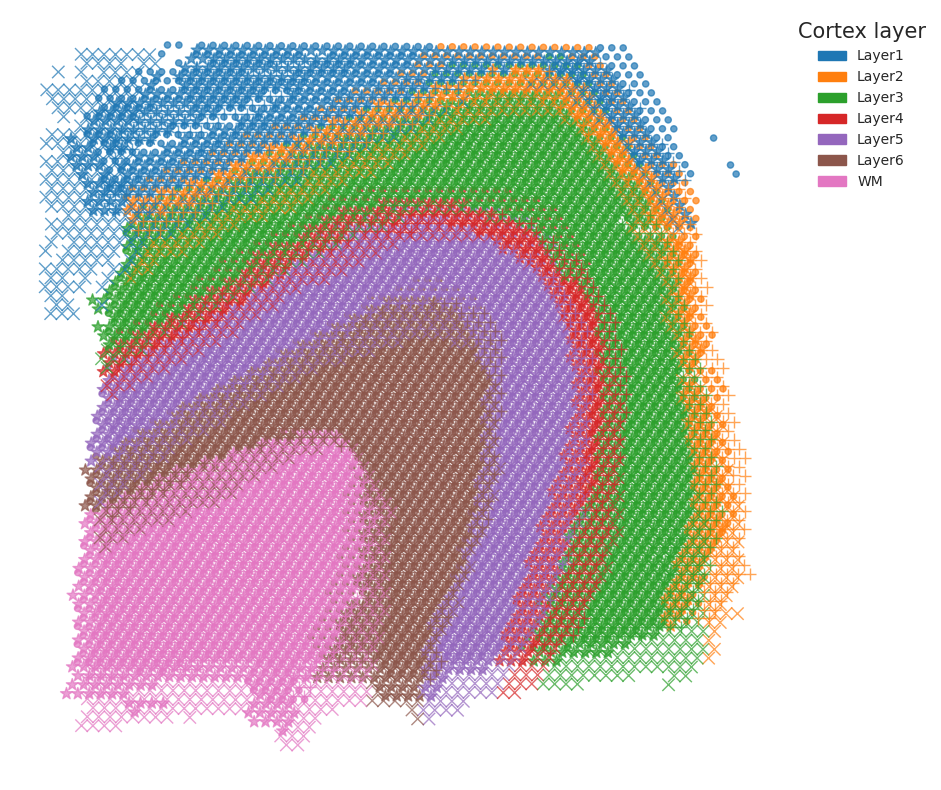

In [18]:
# Plot Stacking of Four slices without alignment
plot_slices_overlap(layer_groups, adatas, sample_list, layer_to_color_map)

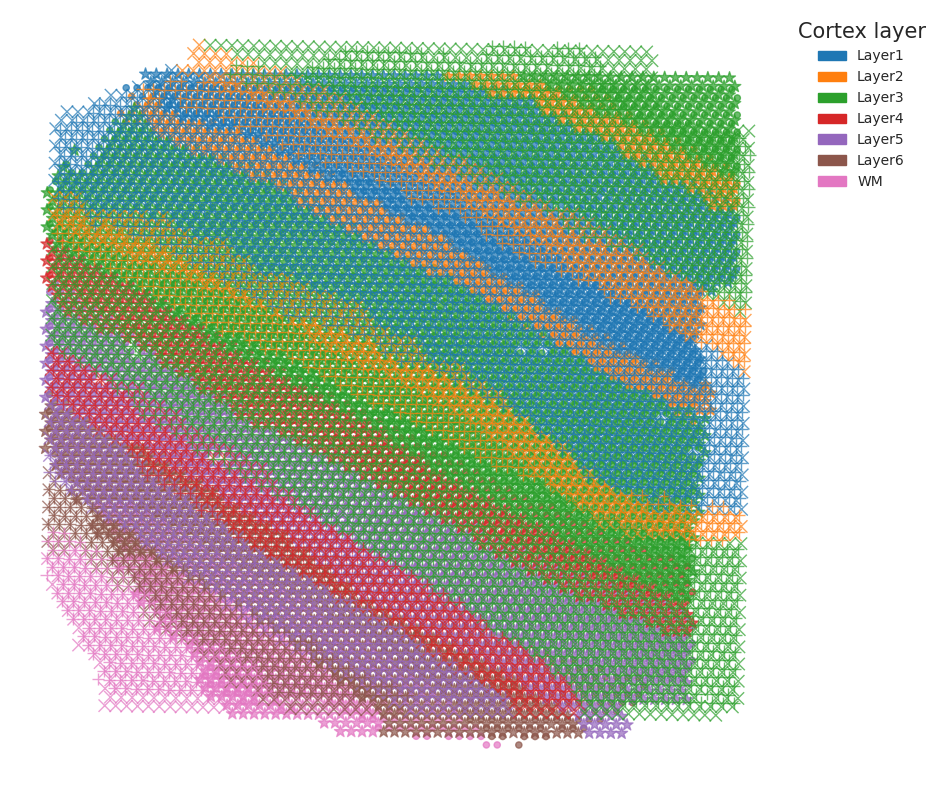

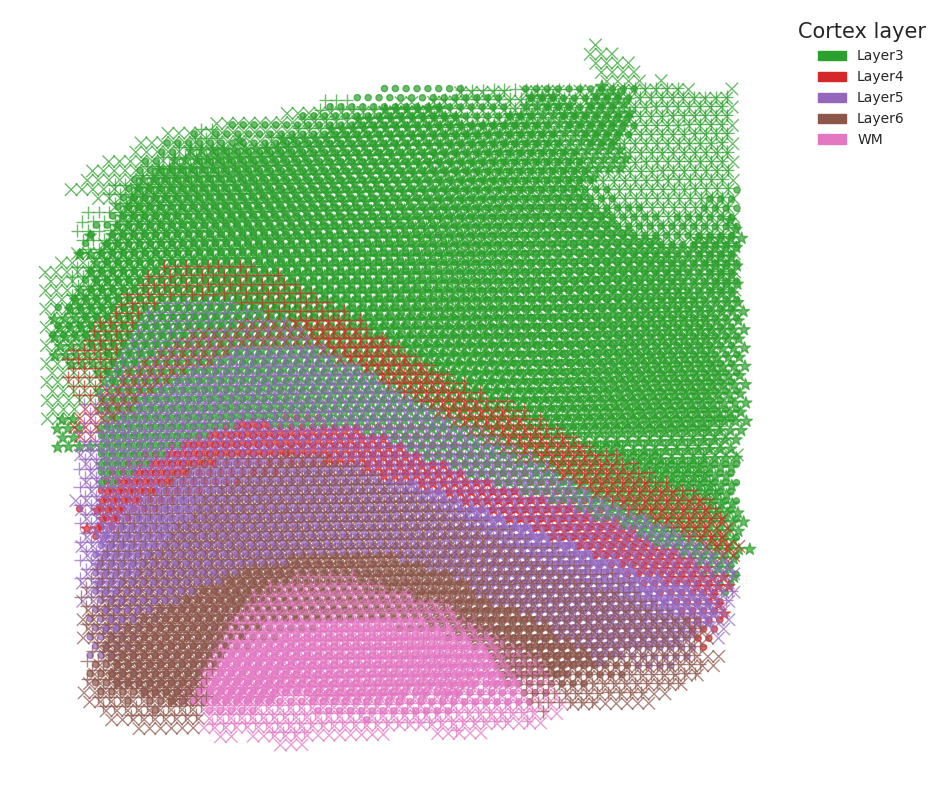

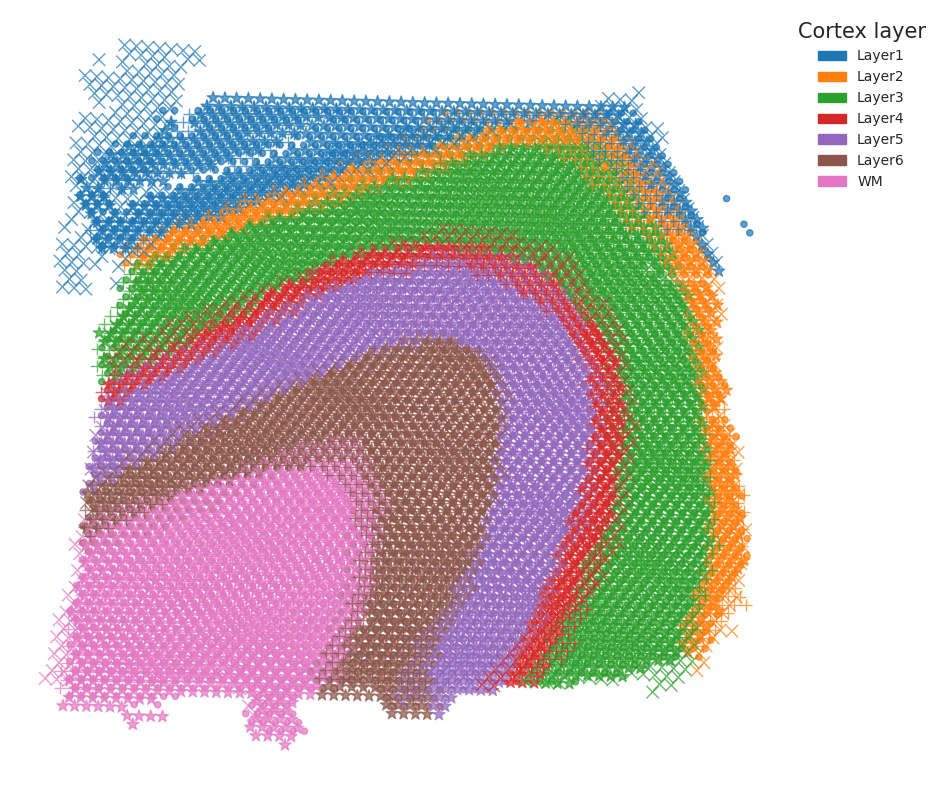

In [19]:
# Plot Stacking of Four slices with PASTE alignment
plot_slices_overlap(paste_layer_groups, adatas, sample_list, layer_to_color_map)


In [20]:
# Redefine a generate_3d_spatial_data function to add a third spatial dimension to the spatial data by stacking an array of j*100 values for each group of the list 'groups'

def generate_3d_spatial_data(groups, dataset_name='dlpfc', save=False):
    spatial_3d_data = []
    
    for i in range(len(groups)):
        rsta_list = []
        
        for j in range(len(groups[i])):
            a = groups[i][j]
            spatial = a.obsm['spatial']
            spatial_z = np.ones(shape=(spatial.shape[0],1))*j*100
            spatial_3d = np.hstack([spatial,spatial_z])
            a.obsm['spatial_3d'] = spatial_3d
            rsta_list.append(a)
            
        a_concat = rsta_list[0].concatenate(rsta_list[1:])
        spatial_3d_data.append(a_concat)
        
        if save:
            a_concat.write_h5ad(f'{dataset_name}_sample{i}_3d.h5ad')
            
    return spatial_3d_data

In [21]:
layer_groups_spatial_3d_data = generate_3d_spatial_data(layer_groups, dataset_name='dlpfc', save=True)

/home/linsenlin/anaconda3/envs/alignment/lib/python3.8/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/home/linsenlin/anaconda3/envs/alignment/lib/python3.8/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/home/linsenlin/anaconda3/envs/alignment/lib/python3.8/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from 

In [22]:
paste_layer_groups_spatial_3d_data = generate_3d_spatial_data(paste_layer_groups, dataset_name='dlpfc', save=True)

/home/linsenlin/anaconda3/envs/alignment/lib/python3.8/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/home/linsenlin/anaconda3/envs/alignment/lib/python3.8/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/home/linsenlin/anaconda3/envs/alignment/lib/python3.8/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from 